<center>
<a href="http://www.insa-toulouse.fr/" ><img src="http://www.math.univ-toulouse.fr/~besse/Wikistat/Images/logo-insa.jpg" style="float:left; max-width: 120px; display: inline" alt="INSA"/></a> 
<a href="https://gei.insa-toulouse.fr/fr/index.html" ><img src="https://gei.insa-toulouse.fr/_contents/ametys-internal%253Asites/dgei/ametys-internal%253Acontents/accueil-entete-de-page-d-accueil/_attribute/header%5B1%5D/header-illustration/image/GEI1.jpg?objectId=defaultWebContent://a9e49303-df60-47de-ab70-5ddb981c9d08" style="max-width: 150px; display: inline;" alt="Département GEI"/> </a>
<a href="http://wikistat.fr/" ><img src="http://www.math.univ-toulouse.fr/~besse/Wikistat/Images/wikistat.jpg" style="float:right;max-width: 150px; display: inline;"  alt="Wikistat"/> </a>
     
</center>

# Smart cameras to support biodiversity - The tetrao urogallus case

<h3> <i> Image classification  on presence or absence of bird dataset.</i> </h3>

## Summary

The following code is highly inspired by the tutorial taught at INSA in the mathematics departement, which can be found at the following link : https://github.com/wikistat/High-Dimensional-Deep-Learning

The data is stored in google drive at the following link: https://drive.google.com/file/d/1a9GFnGDTDckBusp4EU-h6IokSsphWTdG/view?usp=sharing.

Before running the algorithms, the data must be downloaded and store in the parent folder of this notebook.

## Objectives

The objective of the project is to preserve biodiversity. We focus on the tetrao urogallus, which is a bird living in the Pyrennean mountains. Thus, we implemented an algorithm detecting the presence and the absence of the tetrao urogallus on given pictures. To do so, we tried using : 
* Convolutional networks to  build image classifiers on colour images
* Pre-trained models (VGG/Inception to improve the accuracy of the results)
* Fine-Tuned pre-trained models


## Libraries

In [86]:
# Utils
import sys
import os
import shutil
import time
import pickle
import numpy as np
from sklearn.metrics import confusion_matrix
import pandas as pd


# Deep Learning Librairies
import tensorflow as tf
import tensorflow.keras.preprocessing.image as kpi
import tensorflow.keras.layers as kl
import tensorflow.keras.optimizers as ko
import tensorflow.keras.backend as k
import tensorflow.keras.models as km
import tensorflow.keras.applications as ka

# Data visualization
from matplotlib import pyplot as plt

These code lines allow you to check if your computer is using CPU or GPU ressources. <br>
**Warning** : You won't be able to use GPU if another notebook is open and still uses GPU.

In [87]:
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 11143634105751048986
, name: "/device:XLA_CPU:0"
device_type: "XLA_CPU"
memory_limit: 17179869184
locality {
}
incarnation: 2964284719146223393
physical_device_desc: "device: XLA_CPU device"
]


In [88]:
MODE = "GPU" if "GPU" in [k.device_type for k in device_lib.list_local_devices()] else "CPU"
print(MODE)

CPU


## Dataset

The dataset used in this algorithm is composed of pictures given by the federation of hunters of the aude, for who we are working. We sorted and labelled all the pictures ourselves. 

As our goal here is to detect the presence or not of the tetrao urogallus, we sorted the pictures in two directories : presence and absence. The sample of this dataset is available in the *data* directory. It contains:

* 160 images with the tetrao urogallus and 160 images without it for training. 
* 40 images with the tetrao urogallus and 40 images without it for validation.


### Dataset organisation

To use some of the image generators of keras, that we will use later, we have to organise the dataset so that each data of a same class are within the same folder. 

Our data are then organized this way :

```
data_dir
└───train/
│   └───absence/
│   │   │   absence_t_0001.jpg
│   │   │   absence_t_0002.jpg
│   │   │   ...
│   └───presence/
│   │   │   presence_t_0001.jpg
│   │   │   presence_t_0002.jpg
│   │   │   ...
└───validation/
│   └───absence/
│   │   │   absence_v_0001.jpg
│   │   │   absence_v_0002.jpg
│   │   │   ...
│   └───presence/
│   │   │   presence_v_0001.jpg
│   │   │   presence_v_0002.jpg
│   │   │   ...
```

###  Reading the data

In [89]:
data_dir = '../data/' # data path

# Sample directory path
# That way we can use this algorithm with an other sample if we have mire pictures in the future.


### Illustration of the data

The `load_img` function allows to load an image as a PIL image.

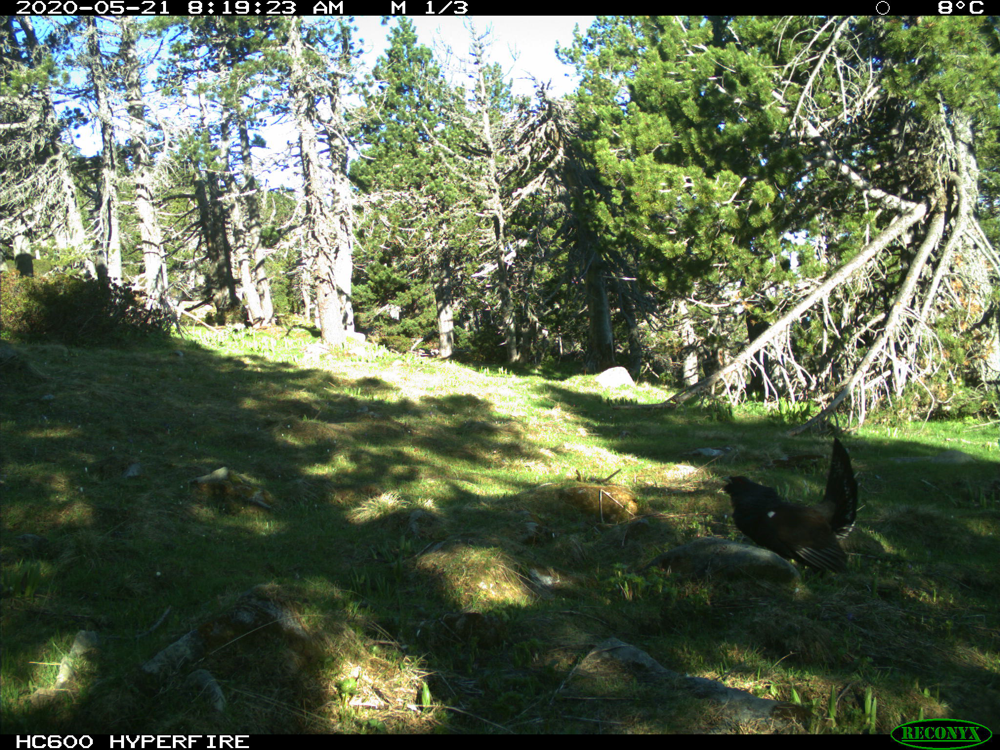

In [90]:
img = kpi.load_img(data_dir+'train/presence/presence_t_0001.jpg') 
img

The function `img_to_array` generates an `array numpy` from a  PIL image.

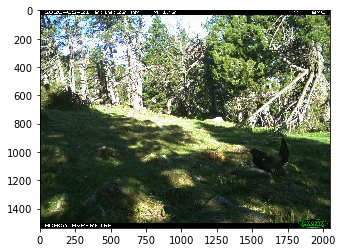

In [91]:
x = kpi.img_to_array(img)  
plt.imshow(x/255, interpolation='nearest')
plt.show()

## Pre-processing

The `ImageDataGenerator` `keras`function allows to apply different treatments on the images (transformation, normalisation). This transformation allows to produce tranformation on the images without saving a lot of changed images on the disk. The transformations make the classifier more robust. As we did not have a lot of images with the tetrao urogallus, it allowed us to have more and thus train the algorithm better.

All the possible transformations are listed in the documentation of the function.

In [92]:
datagen = kpi.ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest')

In oder to visualize the transformed images, we will use the`.flow()` command that generates transformed images from an original image and saves them in the specified directory.

In the following code we produce 8 of these transformed images.

In [93]:
img = kpi.load_img(data_dir+"/train/presence/presence_t_0001.jpg")
x = kpi.img_to_array(img)  
x_ = np.expand_dims(x, axis=0)

if not(os.path.isdir(data_dir+"/preprocessing_example")):
    os.mkdir(data_dir+"/preprocessing_example")

    i = 0
    for batch in datagen.flow(x_, batch_size=1,save_to_dir=data_dir+"/preprocessing_example", save_prefix='bird', save_format='jpg'):
        i += 1
        if i > 7:
            break  

Display transformed images

<ipython-input-94-e0bc57d35237>:16: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "bbox_to_anchor" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig("bird_transformation.png", dpi=100, bbox_to_anchor="tight", facecolor=fig.get_facecolor())


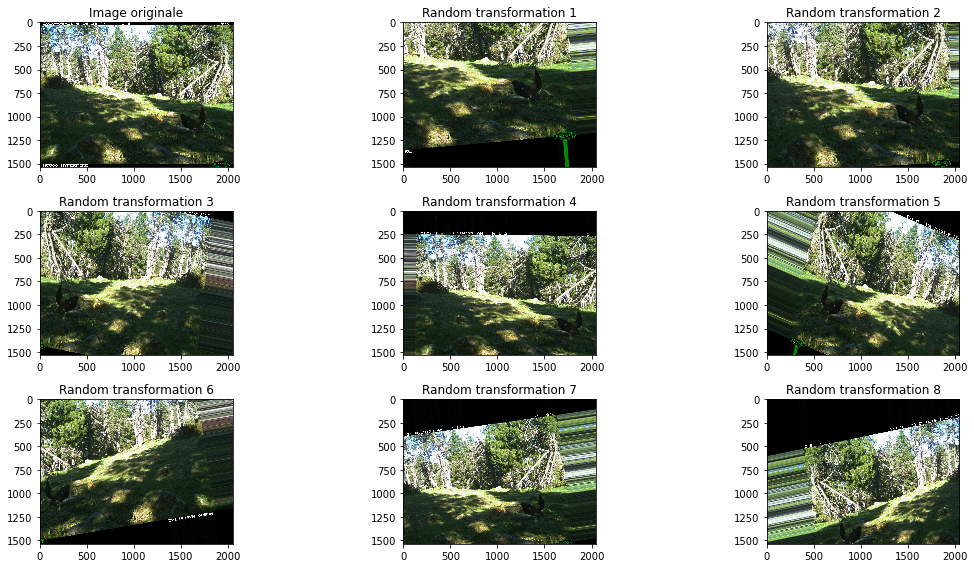

In [94]:
X_list=[]
for f in os.listdir(data_dir+"/preprocessing_example"):
    X_list.append(kpi.img_to_array(kpi.load_img(data_dir+"/preprocessing_example/"+f)))


fig=plt.figure(figsize=(16,8))
fig.patch.set_alpha(0)
ax = fig.add_subplot(3,3,1)
ax.imshow(x/255, interpolation="nearest")
ax.set_title("Image originale")
for i,xt in enumerate(X_list):
    ax = fig.add_subplot(3,3,i+2)
    ax.imshow(xt/255, interpolation="nearest")
    ax.set_title("Random transformation %d" %(i+1))
plt.tight_layout()
plt.savefig("bird_transformation.png", dpi=100, bbox_to_anchor="tight", facecolor=fig.get_facecolor())
plt.show()

## 1- Image classification from scratch with a convolutional network

We will here build a classifier with a custom architecture of a convolutional network.

We first define epochs and batch_size parameters.

* `epochs`: we start with a small number (5-10) in order to check that computing time is reasonable.
* `batch_size`:When using keras Generator, size of the batch should be a divider of the size of the sample, otherwise algorithms produce very unstable results.


In [95]:
epochs = 20
batch_size=20

N_train = 618
N_val = 366

### Data Generation

We defined two `ImageDataGenerator` objects :

* `train_datagen`: for learning, where different transformations are applied as above, in order to pass various examples to the model.
* `valid_datagen`: for validation, where only rescaling is applied.


Images all have the same dimensions :

In [96]:
x_0 = kpi.img_to_array(kpi.load_img(data_dir+"/train/presence/presence_t_0001.jpg"))
x_1 = kpi.img_to_array(kpi.load_img(data_dir+"/train/presence/presence_t_0002.jpg"))
x_0.shape, x_1.shape

((1536, 2048, 3), (1536, 2048, 3))

The `flow_from_directory` method allows to specify an output dimension in which all transformed images will be produced. We divided the dimensions for our images by ten to reduce the parameters of the algorithm.

In [97]:
# divisible par 6 et minimum 32 pour passer les couches de max pooling du VGG
img_width = 58 #384  
img_height = 36 #216

In [98]:
# this is the augmentation configuration we will use for training
train_datagen = kpi.ImageDataGenerator(
        rescale=1./255,
        rotation_range=40)

# this is the augmentation configuration we will use for testing:
# only rescaling
valid_datagen = kpi.ImageDataGenerator(rescale=1./255)

# this is a generator that will read pictures found in
# subfolers of 'data/train', and indefinitely generate
# batches of augmented image data
train_generator = train_datagen.flow_from_directory(
        data_dir+"/train/",  # this is the target directory
        target_size=(img_width, img_height),  
        batch_size=batch_size,
        class_mode='binary')  # since we use binary_crossentropy loss, we need binary labels

# this is a similar generator, for validation data
validation_generator = valid_datagen.flow_from_directory(
        data_dir+"/validation/",
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='binary')

Found 618 images belonging to 2 classes.
Found 366 images belonging to 2 classes.


In [14]:
Y_tra=[]

for f in os.listdir(data_dir+"/train/absence"):
    if f.endswith(".JPG") or f.endswith(".jpg"):
        Y_tra.append(0)
        continue
    else:
        continue

for f in os.listdir(data_dir+"/train/presence"):
    if f.endswith(".JPG") or f.endswith(".jpg"):
        Y_tra.append(1)
        continue
    else:
        continue
    
Y_train=np.array(Y_tra)

In [15]:
Y_valid=[]

for f in os.listdir(data_dir+"/validation/absence"):
    if f.endswith(".JPG") or f.endswith(".jpg"):
        Y_valid.append(0)
        continue
    else:
        continue

for f in os.listdir(data_dir+"/validation/presence"):
    if f.endswith(".JPG") or f.endswith(".jpg"):
        Y_valid.append(1)
        continue
    else:
        continue
        
Y_val=np.array(Y_valid)

### Model architecture

The model we define is composed of 3 convolution blocks with the following form : 

* A Conv2D layer with 32-3X3 filters and a `Relu` activation function.
* A MaxPooling layer with 2X2 window.

Followed by 


* A flatten layer.
* A Dense layer with 64 neurons and a Relu activation function.
* A Dropout layer with a 50% drop rate.
* A Dense layer with 1 neuron and a softmax activation function.

In [16]:
model_conv = km.Sequential()
model_conv.add(kl.Conv2D(32, (3, 3), input_shape=(img_width, img_height, 3), data_format="channels_last"))
model_conv.add(kl.Activation('relu'))
model_conv.add(kl.MaxPooling2D(pool_size=(2, 2)))

model_conv.add(kl.Conv2D(32, (3, 3)))
model_conv.add(kl.Activation('relu'))
model_conv.add(kl.MaxPooling2D(pool_size=(2, 2)))

model_conv.add(kl.Conv2D(64, (3, 3)))
model_conv.add(kl.Activation('relu'))
model_conv.add(kl.MaxPooling2D(pool_size=(2, 2)))

model_conv.add(kl.Flatten())  # this converts our 3D feature maps to 1D feature vectors
model_conv.add(kl.Dense(64))
model_conv.add(kl.Activation('relu'))
model_conv.add(kl.Dropout(0.5))
model_conv.add(kl.Dense(1))
model_conv.add(kl.Activation('sigmoid'))

model_conv.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 56, 34, 32)        896       
_________________________________________________________________
activation (Activation)      (None, 56, 34, 32)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 17, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 26, 15, 32)        9248      
_________________________________________________________________
activation_1 (Activation)    (None, 26, 15, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 13, 7, 32)         0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 11, 5, 64)         1

As our problem here is a two classes classifier we will use the `binary_crossentropy` loss function.

In [17]:
model_conv.compile(loss='binary_crossentropy',
              optimizer='rmsprop',
              metrics=['accuracy'])



#### Training

The training can then be done by using the `fit_generator` function instead of the `fit` function used in the MNIST notebook. This function can be used by passing generator object instead of the data to the function

In [18]:
ts = time.time()
model_conv.fit(train_generator, steps_per_epoch=N_train // batch_size, epochs=epochs, 
                         validation_data=validation_generator,validation_steps=N_val // batch_size)
te = time.time()
t_learning_conv_simple_model = te-ts
print("Learning Time for %d epochs : %d seconds"%(epochs,t_learning_conv_simple_model))


Epoch 1/20
30/30 [==============================] - 89s 3s/step - loss: 0.6153 - accuracy: 0.7375 - val_loss: 0.3389 - val_accuracy: 0.9000
Epoch 2/20
30/30 [==============================] - 87s 3s/step - loss: 0.5700 - accuracy: 0.7441 - val_loss: 0.4404 - val_accuracy: 0.9028
Epoch 3/20
30/30 [==============================] - 86s 3s/step - loss: 0.5382 - accuracy: 0.7425 - val_loss: 0.4725 - val_accuracy: 0.9000
Epoch 4/20
30/30 [==============================] - 86s 3s/step - loss: 0.4609 - accuracy: 0.7525 - val_loss: 0.4679 - val_accuracy: 0.8806
Epoch 5/20
30/30 [==============================] - 88s 3s/step - loss: 0.4263 - accuracy: 0.7659 - val_loss: 0.4534 - val_accuracy: 0.7472
Epoch 6/20
30/30 [==============================] - 88s 3s/step - loss: 0.4088 - accuracy: 0.7809 - val_loss: 0.4053 - val_accuracy: 0.8500
Epoch 7/20
30/30 [==============================] - 87s 3s/step - loss: 0.3951 - accuracy: 0.7993 - val_loss: 0.6165 - val_accuracy: 0.5083
Epoch 8/20
30/30 [==

#### Prediction

In [19]:
ts = time.time()
score_conv_val = model_conv.evaluate_generator(validation_generator, N_val /batch_size, verbose=1)
score_conv_train = model_conv.evaluate_generator(train_generator, N_train / batch_size, verbose=1)
te = time.time()
t_prediction_conv_simple_model = te-ts
print('Train accuracy:', score_conv_train[1])
print('Validation accuracy:', score_conv_val[1])
print("Time Prediction: %.2f seconds" %t_prediction_conv_simple_model )

Instructions for updating:
Please use Model.evaluate, which supports generators.
31/30 [==============================] - 55s 2s/step - loss: 0.2101 - accuracy: 0.9110
Train accuracy: 0.9110032320022583
Validation accuracy: 0.7732240557670593
Time Prediction: 94.56 seconds


## Results

In [20]:
datagen = kpi.ImageDataGenerator(rescale=1. / 255)

generator = datagen.flow_from_directory(
        data_dir+"/train",
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,  # this means our generator will only yield batches of data, no labels
        shuffle=False)  
ychapproba = model_conv.predict_generator(generator, N_train / batch_size,  verbose = 1)



generator = datagen.flow_from_directory(
    data_dir+"/validation",
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)
ypredproba = model_conv.predict_generator(generator, N_val / batch_size,  verbose = 1)    

Found 618 images belonging to 2 classes.
Instructions for updating:
Please use Model.predict, which supports generators.
31/30 [==============================] - 55s 2s/step
Found 366 images belonging to 2 classes.
19/18 [===============================] - 32s 2s/step


In [21]:
ychap=[]
for i in range(len(ychapproba)):
    if ychapproba[i]>1/2:
        ychap.append("P")
    else:
        ychap.append("A")
        
Y_trainlabel=[]
for i in range(len(Y_train)):
    if Y_train[i]==1:
        Y_trainlabel.append("P")
    else:
        Y_trainlabel.append("A")

In [22]:
ypred=[]
for i in range(len(ypredproba)):
    if ypredproba[i]>1/2:
        ypred.append("P")
    else:
        ypred.append("A")
        
Y_vallabel=[]
for i in range(len(Y_val)):
    if Y_val[i]==1:
        Y_vallabel.append("P")
    else:
        Y_vallabel.append("A")

### Matrice de confusion sur l'échantillon d'apprentissage

In [23]:
labels = ["A","P"]

pd.DataFrame(confusion_matrix(ychap,Y_trainlabel),index = labels, columns=labels)



,A,P
A,445,35
P,14,124


### Matrice de confusion sur l'échantillon  de validation

In [24]:
pd.DataFrame(confusion_matrix(ypred,Y_vallabel),index = labels, columns=labels)



,A,P
A,260,13
P,70,23


In order to improve the performances, one can use a pretrained network. This is the purpose of the next section. 

## 2- Pre-trained Network

We have seen above that the complexity of the data makes it difficult to build quickly an efficient classifier from scratch even  with an elaborate method as a convolutional network.

We will now see that this problem can easily be tackled by using **pre-trained models**. These models are models that are very complex (see image below). They have been trained on a very huge amount of image data in order to classify them. 

The figure below represents a *VGG 16*. This model is composed of *5 convolutional blocks* which allows to build features on the images. The last block is a *fully convolutional block*. This last block can be seen as a simple *MLP model* which is used on the features build by the convolutional block.

Here is our two-stage strategy :  
1. We will send our data through the 5 convolutional blocks in order to build features. These blocks have been trained on a huge amount of data and can then build intelligent features.
2. We will build our own MLP classifier designed to solve our absence/presence problem, and we will train it on the features built on the first step.


### Network illustration

![](https://blog.keras.io/img/imgclf/vgg16_original.png)

### Step 1 : Build features

#### Download  the weights of the 5 blocks convolutional layer.

We will now download the weights of a VGG16 model that has been learned on the [image-net](http://www.image-net.org) dataset. The image-net is composed of millions of images for 1000 categories.

If it's the first time you use these weights, you will have to download it (it will start automatically) and they will be save in your home 
`"~/.keras/models"`

The *include_top* argument of the `VGG16` application allows to precise if we want to use or not the last block (fully-connected later)


In [25]:
model_VGG16_without_top = ka.VGG16(include_top=False, weights='imagenet')
model_VGG16_without_top.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

#### Building features

We will now send our data to the loaded model in order to build our features.

In [26]:
datagen = kpi.ImageDataGenerator(rescale=1. / 255)

generator = datagen.flow_from_directory(
        data_dir+"/train",
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,  # this means our generator will only yield batches of data, no labels
        shuffle=False)  
features_train = model_VGG16_without_top.predict_generator(generator, N_train / batch_size,  verbose = 1)


generator = datagen.flow_from_directory(
    data_dir+"/validation",
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)
features_validation = model_VGG16_without_top.predict_generator(generator, N_val / batch_size,  verbose = 1)    

Found 618 images belonging to 2 classes.
31/30 [==============================] - 54s 2s/step
Found 366 images belonging to 2 classes.
19/18 [===============================] - 31s 2s/step


In [27]:
print(N_val)

366


In [28]:
features_train.shape[1:]

(1, 1, 512)

### Step 2 :  Building our classifier on top of features

We will now build a simple classifier in order to use the previously build features to classify our data.


In [29]:
# %load solutions/classifier_pretrained_model.py
model_VGG_fcm = km.Sequential()
model_VGG_fcm.add(kl.Flatten(input_shape=features_train.shape[1:]))
model_VGG_fcm.add(kl.Dense(64, activation='relu'))
model_VGG_fcm.add(kl.Dropout(0.5))
model_VGG_fcm.add(kl.Dense(1, activation='sigmoid'))

model_VGG_fcm.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

model_VGG_fcm.summary()



model_VGG_fcm.fit(features_train, Y_train,
          epochs=epochs,
          batch_size=batch_size,
          validation_data=(features_validation, Y_val))

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 64)                32832     
_________________________________________________________________
dropout_1 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 65        
Total params: 32,897
Trainable params: 32,897
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
31/31 [==============================] - 0s 4ms/step - loss: 0.5923 - accuracy: 0.7201 - val_loss: 0.3982 - val_accuracy: 0.9290
Epoch 2/20
31/31 [==============================] - 0s 1ms/step - loss: 0.4708 - accuracy: 0.7670 - val_loss

We now save the weights of this classifier to be used later.

### Prediction

In [30]:
ts = time.time()
score_VGG_fcm_val = model_VGG_fcm.evaluate(features_validation, Y_val)
score_VGG_fcm_train = model_VGG_fcm.evaluate(features_train, Y_train)
te = time.time()
t_prediction_VGG_fcm = te-ts
print('Train accuracy:', score_VGG_fcm_train[1])
print('Validation accuracy:', score_VGG_fcm_val[1])
print("Time Prediction: %.2f seconds" %t_prediction_VGG_fcm)

20/20 [==============================] - 0s 570us/step - loss: 0.1104 - accuracy: 0.9612
Train accuracy: 0.9611650705337524
Validation accuracy: 0.9289617538452148
Time Prediction: 0.09 seconds


In [31]:
model_VGG_fcm.save_weights(data_dir+'/weights_model_VGG_fully_connected_model_%d_epochs_%d_batch_size.h5' %(epochs, batch_size))

## Results

In [32]:
ychapproba = model_VGG_fcm.predict(features_train)


ypredproba = model_VGG_fcm.predict(features_validation)   

In [33]:
ychap=[]
for i in range(len(ychapproba)):
    if ychapproba[i]>1/2:
        ychap.append("P")
    else:
        ychap.append("A")
        
Y_trainlabel=[]
for i in range(len(Y_train)):
    if Y_train[i]==1:
        Y_trainlabel.append("P")
    else:
        Y_trainlabel.append("A")

In [34]:
ypred=[]
for i in range(len(ypredproba)):
    if ypredproba[i]>1/2:
        ypred.append("P")
    else:
        ypred.append("A")
        
Y_vallabel=[]
for i in range(len(Y_val)):
    if Y_val[i]==1:
        Y_vallabel.append("P")
    else:
        Y_vallabel.append("A")

### Matrice de confusion sur l'échantillon de validation

In [35]:
labels = ["A","P"]

pd.DataFrame(confusion_matrix(ychap,Y_trainlabel),index = labels, columns=labels)

,A,P
A,446,11
P,13,148


### Matrice de confusion sur l'échantillon  de validation

In [36]:
pd.DataFrame(confusion_matrix(ypred,Y_vallabel),index = labels, columns=labels)

,A,P
A,308,4
P,22,32


## Test du réseau préentrainé sur une nouvelle image

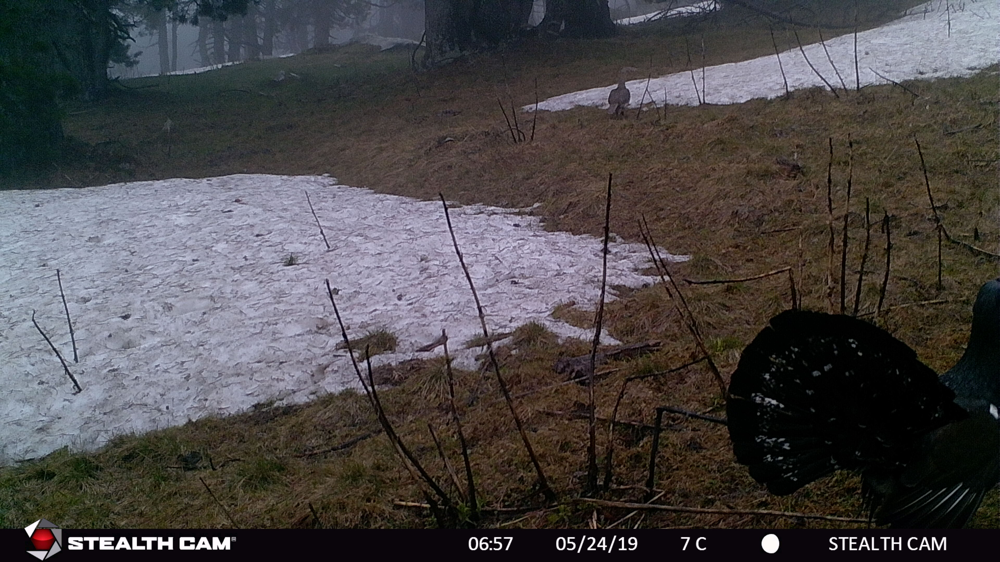

In [179]:
from PIL import Image
image = Image.open(data_dir+'validation/presence/presence_v_0001.jpg')
image


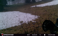

In [180]:
image1=image.resize((58,36))
image1.save

In [181]:
x = kpi.img_to_array(image1)  

In [182]:
x.shape

(36, 58, 3)

In [183]:
# le modèle VGG16 prend en entrée des images de dimension [None,None,None,3], on ajoute donc une dimension
x_in = np.expand_dims(x, 0)

In [184]:
x_in.shape

(1, 36, 58, 3)

In [185]:
features_img = model_VGG16_without_top.predict(x_in)

In [186]:
proba_img=model_VGG_fcm.predict(features_img)

In [174]:
if proba_img>1/2:
        print("Presence")
else:
        print("Absence")

Presence


In [188]:
# Avec une autre image (sans l'oiseau)

from PIL import Image
image = Image.open(data_dir+'validation/absence/absence_v_0012.jpg')
image1=image.resize((58,36))
x = kpi.img_to_array(image1)
x_in = np.expand_dims(x, 0)
features_img = model_VGG16_without_top.predict(x_in)
proba_img=model_VGG_fcm.predict(features_img)
if proba_img>1/2:
        print("Presence")
else:
        print("Absence")

Absence


# Conclusion

Les réseaux pré entrainés offrent de très bons résultats (92%).